# Gaussian Pictures

Gabriel Casselman

This notebook aims to explore gaussian splatting in a simplified 2D context. Using a finite set of 2D gaussian splats with variable color, scale, rotation and position, how can we train them to look like a _target_ image?


In [16]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import torchvision.transforms as transforms

import numpy as np
from PIL import Image

import matplotlib.pyplot as plt

from typing import Tuple
import io
import requests

from IPython.display import Image as IPyImage, display

## Fuzzy Friends

The core of gaussian splatting is of course, the gaussian, in 2D, a fuzzy ellipse shaped function. In the original gaussian splatting paper they use the following definition.

$$
G(\mathbf{x}) = e^{-\frac{1}{2}(\mathbf{x}^T)\Sigma^{-1}(\mathbf{x}))}
$$

The covariance matrix $\Sigma$ can be found given the rotation and scale of a guassian.

$$
\Sigma=RSS^TR^T
$$

Now, if we were to build out this function directly in `PyTorch`, we would end up having to do a small matrix multiplication for every single gaussian in order to rasterize it [(Appendix: Naive Rasterizer)](#appendix-naive-rasterizer). In `PyTorch`, even with compilation, I found that this leads to the spawning of thousands of small batched matrix multiplication kernels which is extremely inefficient. Instead, because we're working in the 2D case, we can simplify this expression and remove matrix multiplication entirely.

### Math Time

Let the rotation be an angle $\theta$ and the two dimensional scale be given as $s_x$ and $s_y$. The rotation and scale are standard affine transformations matrices.

$$
R = \begin{bmatrix}
\cos(\theta) & \sin(\theta) \\
-\sin(\theta) & \cos(\theta)
\end{bmatrix}
\quad
S = \begin{bmatrix}
s_x & 0 \\
0 & s_y
\end{bmatrix}
$$

We can write $\Sigma$ expanded, noting that because $S$ is diagonal, it is it's own transpose and we can just write down the $SS^T$ term.

$$
\Sigma = \begin{bmatrix}
\cos(\theta) & \sin(\theta) \\
-\sin(\theta) & \cos(\theta)
\end{bmatrix}
\begin{bmatrix}
s_x^2 & 0 \\
0 & s_y^2
\end{bmatrix}
\begin{bmatrix}
\cos(\theta) & -\sin(\theta) \\
\sin(\theta) & \cos(\theta)
\end{bmatrix}
$$

$$
\Sigma = \begin{bmatrix}
s_x^2\cos^2(\theta) + s_y^2\sin^2(\theta) &
-s_x^2\sin(\theta)\cos(\theta) + s_y^2\sin(\theta)\cos(\theta) \\
-s_x^2\sin(\theta)\cos(\theta) + s_y^2\sin(\theta)\cos(\theta) &
s_x^2\sin^2(\theta) + s_y^2\cos^2(\theta)
\end{bmatrix}
$$

Because we have repeated terms, it's more concise to define a few new variables that represent the variances and covariance within the matrix.

$$
\begin{align*}
    \sigma^2_x &= s_x^2\cos^2(\theta) + s_y^2\sin^2(\theta) \\
    \sigma^2_y &= s_x^2\sin^2(\theta) + s_y^2\cos^2(\theta) \\
    \sigma_{xy} &= -s_x^2\sin(\theta)\cos(\theta) + s_y^2\sin(\theta)\cos(\theta) \\
    \Sigma &= \begin{bmatrix}
        \sigma^2_x & \sigma_{xy} \\
        \sigma_{xy} & \sigma^2_y
    \end{bmatrix}
\end{align*}
$$

Next we can continue by solving for the inverse of the covariance matrix, which is simple in the 2x2 case. For convenience we'll define a variable for each element as well.

$$
\Sigma^{-1}=\frac{1}{\sigma^2_x\sigma^2_y - \sigma_{xy}^2}
\begin{bmatrix}
    \sigma^2_y & -\sigma_{xy} \\
    -\sigma_{xy} & \sigma^2_x
\end{bmatrix}=
\begin{bmatrix}
    \alpha^2_y & -\alpha_{xy} \\
    -\alpha_{xy} & \alpha^2_x
\end{bmatrix}
$$

Finally we can expand the exponent.

$$
\begin{align*}
    \mathbf{x}^T\Sigma^{-1}\mathbf{x} &=
    \begin{bmatrix}
        x & y
    \end{bmatrix}
    \begin{bmatrix}
        \alpha^2_y & -\alpha_{xy} \\
        -\alpha_{xy} & \alpha^2_x
    \end{bmatrix}
    \begin{bmatrix}
        x \\ y
    \end{bmatrix} \\
    &= \alpha^2_y x^2 - 2 \alpha_{xy}xy + \alpha^2_x y^2
\end{align*}
$$

### The Guts

For the actual rasterization implementation, we'll pre-compute the grid of coordinates and pass it in to speed things up slightly. Each set of parameters is batched to rasterize many gaussians at one. Rotation is given from 0 to 1. The means are subtracted from the mesh coordinates to translate the gaussian to the correct location.


In [ ]:
def rasterize_gaussians(
    mesh: Tuple[torch.Tensor, torch.Tensor],
    mean: torch.Tensor,
    scale: torch.Tensor,
    rotation: torch.Tensor,
    color: torch.Tensor,
) -> torch.Tensor:
    """
    Rasterize a batch of gaussians as a single image. The image size is W by H, the number
    of gaussians is represented by B. All image coordinates are normalized [0, 1].

    Args:
        mesh (Tuple[Tensor, Tensor]): Shape (W, H). A meshgrid of 2D coordinates where the
            first tensor is the x coordinates and the second is the y coordinates.
        mean (Tensor): Shape (B, 2). The center of each gaussian.
        scale (Tensor): Shape (B, 2). The scale of each gaussian
        rotation (Tensor): Shape (B, 1). The rotation of each gaussian, mapped between 0 and 1.
        color (Tensor): Shape (B, 3). The RGB colors of each gaussian.

    Returns:
        Tensor: Shape (3, W, H). The rasterized RGB image.

    Gradient behavior:
        Fully differentiable with respect to means, scales, rotations, and colors.
        No grad is required for mesh.
    """

    rot_rad = rotation * 2 * np.pi
    cos_rot = torch.cos(rot_rad)
    sin_rot = torch.sin(rot_rad)

    scale_x, scale_y = scale[:, 0], scale[:, 1]
    scale_x2 = scale_x * scale_x
    scale_y2 = scale_y * scale_y

    var_x = scale_x2 * cos_rot * cos_rot + scale_y2 * sin_rot * sin_rot
    var_y = scale_x2 * sin_rot * sin_rot + scale_y2 * cos_rot * cos_rot
    covar = (scale_y2 - scale_x2) * sin_rot * cos_rot

    det = var_x * var_y - covar * covar

    inv_var_y = var_y / det
    inv_var_x = var_x / det
    inv_covar = covar / det

    # Use broadcasting to replicate the mesh for every gaussian
    # in the batch and to subtract the corresponding means from every coordinate.
    # Flip x and y coords to make first parameter x and second y (convention)
    x_coords = mesh[1].unsqueeze(0) - mean[:, None, None, 0]
    y_coords = mesh[0].unsqueeze(0) - mean[:, None, None, 1]

    # Again, add dimensions to enable broadcasting.
    exponent = (
        inv_var_y[:, None, None] * x_coords * x_coords
        - 2 * inv_covar[:, None, None] * x_coords * y_coords
        + inv_var_x[:, None, None] * y_coords * y_coords
    )
    kernel = torch.exp(-0.5 * exponent)

    return torch.sum(kernel[:, None, :, :] * color[:, :, None, None], dim=0)

In [ ]:
def make_grid(
    width: int, height: int, device: torch.device = "cpu"
) -> Tuple[torch.Tensor, torch.Tensor]:
    """Creates a normalized meshgrid of a certain size

    Args:
        width (int): The width (W) of the grid in pixels.
        height (int): The height (H) of the grid in pixels.
        device (torch.device): The device the grid will reside on.
            Defaults to "cpu".

    Returns:
        tuple[Tensor, Tensor]: A pair of tensors of coordinates for x and y.
            Shapes (W, H).
    """

    # Disable gradients because this does not get optimized
    x = torch.linspace(0, 1, width, device=device, requires_grad=False)
    y = torch.linspace(0, 1, height, device=device, requires_grad=False)
    return torch.meshgrid(y, x, indexing="ij")

Let's test it with a few sample gaussians. Note that we have to permute the input so Matplot understands it (i.e $(3, w, h) \Rightarrow (w, h, 3)$)


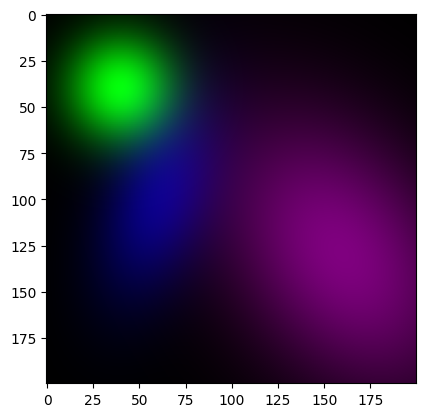

In [4]:
mean = torch.Tensor([[0.2, 0.2], [0.3, 0.5], [0.8, 0.65]])
scale = torch.Tensor([[0.1, 0.1], [0.2, 0.1], [0.2, 0.3]])
rotation = torch.Tensor([0, 0.2, -0.4])
color = torch.Tensor([[0, 1, 0], [0, 0, 0.5], [0.5, 0, 0.5]])

grid = make_grid(200, 200)

img = rasterize_gaussians(grid, mean, scale, rotation, color)
plt.imshow(img.permute(1, 2, 0))

## Lost in the Sauce

In order to optimize our gaussians into an image, we must define a loss function. Gaussian splatting uses the mix of two losses, L1 and SSIM. Applying the L1 loss is a trivial `PyTorch` method, however SSIM requires some work.

SSIM or Structural Similarity Index Measure, typically is understood to provide a metric for the perceptual difference between two images. Without going into too much detail, it does this by combining a luminance, contrast and structure term, each of which is calculated over a window of the image. For one such window SSIM is defined as follows.

$$
SSIM(x, y) = \frac{(2\mu_x\mu_y + C_1)(2\sigma_{xy}+C_2)}{(\mu_x^2+\mu_y^2+C_1)(\sigma_x^2+\sigma^2_y+C_2)}
$$

Here, $x$ and $y$ are the two images to be compared. $\mu$ is the mean over the window, $\sigma^2$ is the variance and $\sigma_{xy}$ is the covariance between the two images. $C_1$, and $C_2$ are some what arbitrary (according to the original paper), however they are commonly $C_1=(0.01L)^2$, $C_2=(0.03L)^2$ where $L$ is the maximum pixel value (in our case $1$).

The original paper uses an $11\times11$ window size and it weights each pixel by our good friend the gaussian function with a standard deviation of 1.5. Since this is the standard we will go with these values.

In terms of implementation, the kernel can be pre-computed without gradients similar to the mesh from before. Additionally, `PyTorch` comes with some handy convolution functions to make the windowing easier. Lastly, we will average over the SSIM values of the whole image to get one final loss value.


In [5]:
def ssim_kernel(
    size: int = 11, stdev: float = 1.5, device: torch.device = "cpu"
) -> torch.Tensor:
    """Generates a 2D gaussian with unit volume to weight
        the values within a window.

    Args:
        size (int): The square size (S) of the kernel, typically 11x11.
            Defaults to 11.
        stdev (float): The standard deviation of the 2D gaussian.
            Defaults to 1.6.
        device (torch.device): The device the grid will reside on.
            Defaults to "cpu".

    Returns:
        Tensor: Shape (S, S). The 2D kernel values.
    """

    # This gaussian is isotropic (same value for different directions)
    # so we can "cheat" and make it by duplicating a 1D gaussian.

    # The subtracted offset here centers the gaussian within the kernel
    points = torch.arange(size, device=device, requires_grad=False) - (size - 1) / 2
    gaussian_1d = torch.exp(-0.5 * points**2 / stdev**2)
    # Convert to a column vector to make the matrix multiplication
    # work.
    gaussian_1d_norm = (gaussian_1d / gaussian_1d.sum())[:, None]
    return gaussian_1d_norm @ gaussian_1d_norm.t()

Here's a little visual of the kernel.


Total volume: 0.9999998807907104


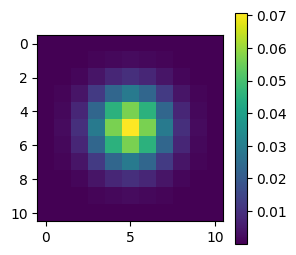

In [6]:
demo_kernel = ssim_kernel()
plt.figure(figsize=(3, 3))
plt.imshow(demo_kernel)
plt.colorbar()

print(f"Total volume: {demo_kernel.sum()}")

In [ ]:
C1 = 0.01**2
C2 = 0.03**2


def ssim_loss(splat: torch.Tensor, target: torch.Tensor, kernel: torch.Tensor) -> float:
    """Calculates the Structured Similarity Index Measure between two
        images of size W x H.

    Args:
        splat (torch.Tensor): Shape (3, W, H). The image we wish to evaluate.
        target (torch.Tensor): Shape (3, W, H). The target image we are
            evaluating against.
        kernel (torch.Tensor): Shape(S, S). A gaussian kernel of size S x S
            used for windowing.

    Returns:
        float: The single mean of the SSIM between the images.

    Gradient behavior:
        Fully differentiable with respect to splat and target.
        No grad is required for the kernel.
    """

    # Add an extra "batch" dimension to make the tensors compatible with
    # torches built in convolution function.
    splat_b = splat.unsqueeze(0)
    target_b = target.unsqueeze(0)
    # Expand the kernel as well to apply to the three channels
    kernel_b = kernel[None, None].expand(3, -1, -1, -1)

    mean_splat = F.conv2d(splat_b, kernel_b, groups=3)
    mean_splat_sq = mean_splat * mean_splat
    mean_target = F.conv2d(target_b, kernel_b, groups=3)
    mean_target_sq = mean_target * mean_target
    mean_splat_target = mean_splat * mean_target

    # Pulling out the squared means is just a math trick, it is equivalent to
    # calculating the variance or covariance normally.
    var_splat = F.conv2d(splat_b * splat_b, kernel_b, groups=3) - mean_splat_sq
    var_target = F.conv2d(target_b * target_b, kernel_b, groups=3) - mean_target_sq
    covar = F.conv2d(splat_b * target_b, kernel_b, groups=3) - mean_splat_target

    numerator = (2 * mean_splat_target + C1) * (2 * covar + C2)
    denominator = (mean_splat_sq + mean_target_sq + C1) * (var_splat + var_target + C2)

    ssim = numerator / denominator

    # Invert so minimizing the loss makes two image more similar.
    return 1 - ssim.mean()

## All Together Now

In order to have performant training, we'll want our entire forward pass (gaussian rasterization), and loss calculations to be combined into a single GPU kernel. We can force this by creating one function and marking it for compilation with `fullgraph=True`. Because means, scales and rotations all are calculated in a normalized space (0 to 1), we apply a sigmoid activation to the actual parameters that are being optimized. This non-linearity makes the training more stable.

In [ ]:
@torch.compile(fullgraph=True)
def forward_with_loss(
    kernel: torch.Tensor,
    target: torch.Tensor,
    mesh: torch.Tensor,
    mean: torch.Tensor,
    scale: torch.Tensor,
    rotation: torch.Tensor,
    color: torch.Tensor,
    ssim_proportion: float = 0.3,
) -> tuple[float, torch.Tensor]:
    """Calculates a loss by applying and activation function, then rasterizing the
        gaussians represented by the given parameters. The rasterized image is
        evaluated against the target which should have the same width (W) and
        height (H).

    Args:
        kernel (torch.Tensor): Shape(S, S). A pre-computed gaussian kernel of
            size S x S used in SSIM.
        target (torch.Tensor): Shape (3, W, H). The target image we are
            training the splat to look like.
        mesh (Tuple[Tensor, Tensor]): Shape (W, H). A pre-computed meshgrid of
            2D coordinates used for rasterizing the gaussians.
        mean (Tensor): Shape (B, 2). The gaussian's position parameter.
        scale (Tensor): Shape (B, 2). The gaussian's size parameter
        rotation (Tensor): Shape (B, 1). The rotation parameter of the gaussian.
        color (Tensor): Shape (B, 3). The RGB color parameter of each gaussian.
        ssim_proportion (float): The proportion of SSIM loss to us versus
            L1 loss. Defaults to 0.3.

    Returns:
        float: The combined L1 and SSIM loss between the raster and the target.
        Tensor: Shape (3, W, H). The rasterized image.

    Gradient behavior:
        Fully differentiable with respect to all gaussian parameters.
        No grad is required for the kernel, target or mesh.
    """

    # n for "normalized", couldn't think of a better letter/word
    mean_n = torch.sigmoid(mean)
    scale_n = torch.sigmoid(scale)
    rotation_n = torch.sigmoid(rotation)
    color_n = torch.sigmoid(color)

    splat = rasterize_gaussians(mesh, mean_n, scale_n, rotation_n, color_n)

    ssim = ssim_loss(splat, target, kernel)
    l1loss = nn.L1Loss()
    loss = (1 - ssim_proportion) * l1loss(splat, target) + ssim_proportion * ssim
    return loss, splat

## Herding Splats

The training process is pretty simple. The trickiest part is initializing the gaussians. I found that a uniform random distribution of mean rotation and color worked fine. 

For scale however, I found that first adding a small $\epsilon$ led to much better numerical stability and less `nan` results. Also, as the number of gaussians increase within a constant sized frame, all of the pixel values become brighter and will go way beyond the 0-1 range. To account for this, we can change the random initialization of the gaussian sizes. Through experimentation [(Appendix: Scaling)](#appendix-scaling), I determined that reducing the scale proportionally to the root of the number of gaussians led to the most stable training.

Other than that, ADAM is used as an optimizer with linear learning rate scheduling. These hyperparameters were found through experimentation. Finally, I added some extra flair by displaying the splat through the training process and optionally creating an animated GIF at the end.

In [66]:
def init_param(param: torch.Tensor) -> nn.Parameter:
    """Applies a logit function to a given tensor and returns it
        as a parameter. Used as a helper function to reduce
        repeated code.

    Args:
        param (torch.Tensor): the input tensor to apply pre-process to

    Returns:
        nn.Parameter: the pre-processed tensor wrapped in a parameter object
    """
    return nn.Parameter(torch.logit(param))


def train(
    src: Image.Image,
    size: tuple[int, int],
    num_gaus: int = 5000,
    learning_rate: float = 0.03,
    num_epochs: int = 1000,
    device: torch.device = "cpu",
    make_animation=False,
    display_freq=100,
) -> torch.Tensor | tuple[torch.Tensor, io.BytesIO]:
    """Given a target image, optimize a set of N 2D gaussians to look like
        the image with photometric loss.

    Args:
        src (PIL.Image): A PIL image used as the target
        size: (tuple[int, int]): The size of the output splat
        num_gauss (int): The number of gaussians to use while fitting.
            Defaults to 5000.
        learning_rate (float): The starting learning rate for optimization.
            Defaults to 0.03.
        num_epochs (int): The number of training epochs to execute.
            Defaults to 1000.
        device (torch.device): Device to perform optimization on.
            Defaults to 'cpu'
        make_animation (bool): If true a gif will also be returned showcasing
            the training. Defaults to False.
        display_freq (int): The number of frames between each display of the
            current splat, epoch and loss. Defaults to 100.

    Returns:
        torch.Tensor: Shape (3, H, W). The final image generated from the splats.
        io.BytesIO: A buffer holding the GIF animation. Only returned if
            make_animation is True.
    """
    target = transforms.PILToTensor()(src.resize(size)) / 255
    # d for "device" (as apposed to "host", standard CUDA lingo :/)
    target_d = target.to(device)

    ssim_kernel_d = ssim_kernel(device=device)
    mesh_d = make_grid(size[0], size[1], device=device)

    mean = init_param(torch.rand(num_gaus, 2, device=device))
    scale = init_param(
        (torch.rand(num_gaus, 2, device=device) + 0.002) / np.sqrt(num_gaus) * 0.8
    )
    rotation = init_param(torch.rand(num_gaus, device=device))
    color = init_param(torch.rand(num_gaus, 3, device=device))

    optimizer = optim.Adam([mean, scale, rotation, color], lr=learning_rate)
    scheduler = optim.lr_scheduler.LinearLR(
        optimizer, start_factor=1.0, end_factor=1e-7, total_iters=num_epochs
    )

    # decreases the frame sampling during training leads to a nicer animation
    if make_animation:
        stride = 1
        stride_rate = 1.01
        imgs = []

    for i in range(num_epochs):
        loss, splat = forward_with_loss(
            ssim_kernel_d, target_d, mesh_d, mean, scale, rotation, color
        )

        if i % display_freq == 0:
            plt.figure(figsize=(2.5, 2.5))
            plt.title(f"epoch: {i} loss: {loss:.5f}")
            plt.axis("off")
            plt.imshow(splat.detach().cpu().permute(1, 2, 0).clamp(0, 1))
            plt.pause(0.1)

        if make_animation:
            if i % int(stride) == 0 or i > num_epochs * 0.95:
                splat_scaled = (
                    splat.detach().cpu().permute(1, 2, 0).numpy() * 255
                ).astype(np.uint8)
                img = Image.fromarray(splat_scaled)
                imgs.append(img)

            stride *= stride_rate

        optimizer.zero_grad()

        loss.backward()

        optimizer.step()
        scheduler.step()

    _, splat = forward_with_loss(
        ssim_kernel_d, target_d, mesh_d, mean, scale, rotation, color
    )

    if make_animation:
        print("Building GIF")
        buf = io.BytesIO()
        imgs[0].save(
            buf,
            format="GIF",
            save_all=True,
            append_images=imgs[1:],
            duration=100,  # ms per frame
            loop=0,
        )
        return splat.detach().cpu().clamp(0, 1), buf

    return splat.detach().cpu().clamp(0, 1)

## Testing It Out

Let's load in a source image of our choice and test it out!

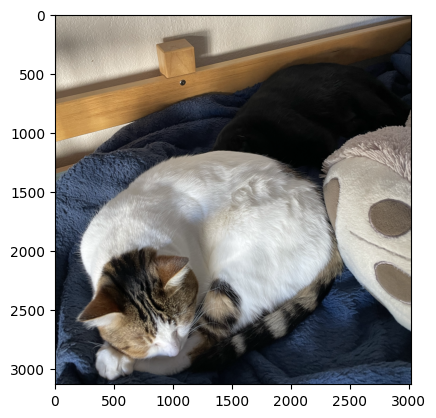

In [20]:
url = "https://github.com/GICMan/gaussian-pictures/blob/main/cats.png?raw=true"
src = Image.open(requests.get(url, stream=True).raw)
plt.imshow(src)

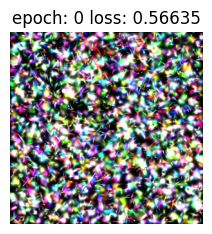

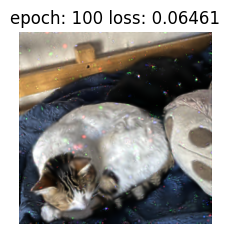

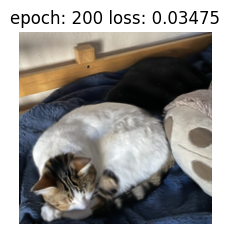

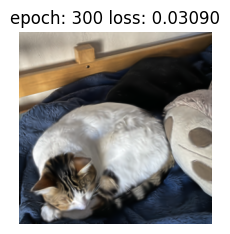

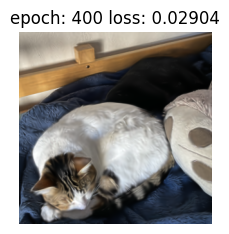

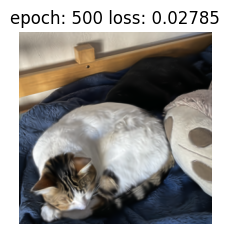

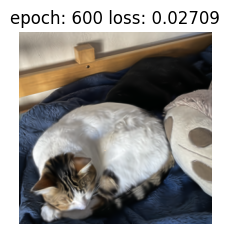

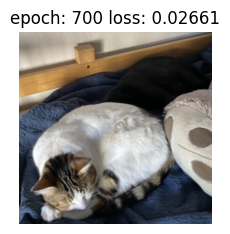

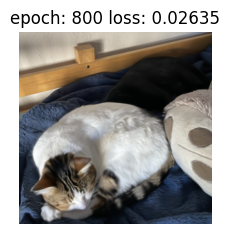

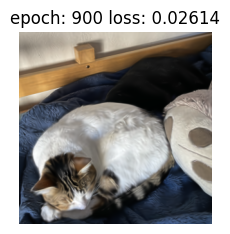

Building GIF


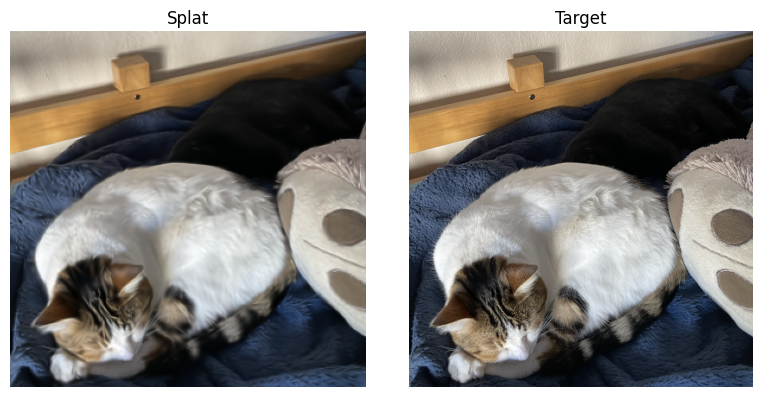

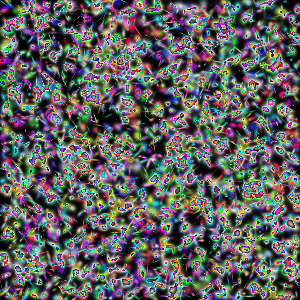

In [67]:
splat, anim_buf = train(
    src, (300, 300), num_gaus=5000, device="cuda", make_animation=True
)

fig, axes = plt.subplots(1, 2, figsize=(8, 4))

axes[0].imshow(splat.permute(1, 2, 0))
axes[0].axis("off")
axes[0].set_title("Splat")

axes[1].imshow(src)
axes[1].axis("off")
axes[1].set_title("Target")

plt.tight_layout()
plt.show()

display(IPyImage(data=anim_buf.getvalue()))

### Final Thoughts

Overall, I was surprised at how well (with enough gaussians), the system could recreate the detail. I particularly choose this image because it has a combination of fluffy (high frequency) and smooth textures. I think it's really interesting to see though the animation how the stochastic gradient decent pushes the gaussians around and how by random chance some get selected more than others. It's also interesting to visualize the local minimums and how there's some oscillations between two sub-optimal states before the learning rate cools down enough for it to settle at an optimized position.

## Appendix: Scaling

Intuitively it makes sense to scale down the gaussians if there are more of them. To determine this relationship, I'm sure there's some analytical strategies and math that could model it. However, I choose to save myself some work and just determine it experimentally with the help of some intuition. I aimed to have the mean pixel value of the raster to be 0.5. First, I observed that the relationship between mean brightness and number of gaussians was linear.

My thought was that it's the gaussians area that contributes to the "brightness" of the raster which we are trying to regulate. So, in my loose approximation it can be thought of as a $w \times h$. If we divide both the width and height by $n$ number of gaussians, we actually are scaling the brightness by $1/n^2$. So the trick then is the divide by the $\sqrt{n}$ to normalize out that linear relationship.

The follow simulation rasters random splats with different numbers of gaussians. I first played around with the $\epsilon$ factor until it rasterized with no `nan` issues. Then, I added in the $\sqrt{n}$ scale factor and played around with it's coefficient until I got slopes that were close *enough* to flat and hovered around 0.5 mean pixel values. This was used in the final code.

In [ ]:
size = 200

device = "cuda"

n_samples = 500
num_gaussians = np.linspace(200, 5_000, num=n_samples, dtype=int)
mean_values = []

mesh = make_grid(size, size, device=device)

with torch.no_grad():
    for i in range(n_samples):
        n = num_gaussians[i]
        means = torch.rand(n, 2, device=device)
        scales = (torch.rand(n, 2, device=device) + 0.002) / np.sqrt(n) * 0.8
        rotations = torch.rand(n, device=device)
        colors = torch.rand(n, 3, device=device)
        g = rasterize_gaussians(mesh, means, scales, rotations, colors)

        mean = torch.mean(g)
        mean_values.append(mean.item())

Slope: 0.22020191, offset: 0.45893
Number of NANs 0
Mean: 572.87425, stdev: 305.82804


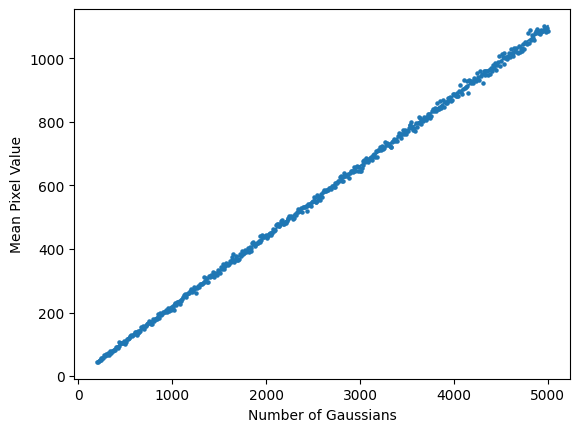

In [55]:
m, b = np.polyfit(num_gaussians, mean_values, 1)
print(f"Slope: {m:.8f}, offset: {b:.5f}")

plt.xlabel("Number of Gaussians")
plt.ylabel("Mean Pixel Value")
plt.scatter(num_gaussians, mean_values, s=5)
plt.plot(num_gaussians, num_gaussians * m + b)

print("Number of NANs", np.isnan(mean_values).sum())
print(f"Mean: {np.mean(mean_values):.5f}, stdev: {np.std(mean_values):.5f}")

## Appendix: Naive Rasterizer

This was my first implementation of a rasterizer. It did not fuse well and using `PyTorch's` built in profiler, I found that it was launching way to many batched matrix kernels, so I decided to expand out the math to give the compile a helping hand.

In [14]:
# @torch.compile
# def gaussians(size, mean, scale, rotation, color, device="cpu"):
#     cos_rot = torch.cos(rotation * 2 * np.pi)
#     sin_rot = torch.sin(rotation * 2 * np.pi)
#     rot_mat = torch.stack(
#         [
#             torch.stack([cos_rot, sin_rot], dim=-1),
#             torch.stack([-sin_rot, cos_rot], dim=-1),
#         ],
#         dim=-2,
#     )

#     scale_mat = torch.diag_embed(scale)

#     covar_inv = torch.inverse(
#         rot_mat @ scale_mat @ scale_mat @ rot_mat.transpose(-1, -2)
#     )

#     x = torch.linspace(0, 1, size[0], device=device)
#     y = torch.linspace(0, 1, size[1], device=device)
#     mesh_x, mesh_y = torch.meshgrid(x, y, indexing="ij")
#     mesh_points = torch.stack([mesh_x, mesh_y], dim=-1)[None] - mean[:, None, None, :]

#     kernel = torch.exp(
#         -0.5 * torch.einsum("bxyi,bij,bxyj->bxy", mesh_points, covar_inv, mesh_points)
#     )

#     combined = torch.sum(kernel[:, None, :, :] * color[:, :, None, None], dim=0)
#     return combined